# **Trabajo Practico 1: Vision por computadora, espacios del color**

Entrega:
       
*   Barbara Cocco
*   Pedro Perez

In [19]:
#python -m pip install numpy matplotlib Pillow
#pip install scikit-image
#pip install opencv-python

In [40]:
import sys
from skimage.metrics import structural_similarity as ssim
print(sys.version)


3.12.2 (tags/v3.12.2:6abddd9, Feb  6 2024, 21:26:36) [MSC v.1937 64 bit (AMD64)]


In [41]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image

In [42]:
# Lista de rutas de las imágenes
rutas_imagenes_white_patch = [
    'test_blue.png',
    'test_green.png',
    'test_red.png',
    'wp_blue.jpg',
    'wp_green.png',
    'wp_green2.jpg',
    'wp_red.png',
    'wp_red2.jpg'
]

rutas_imagenes_coord_cromaticas = [
    'CoordCrom_1.png',
    'CoordCrom_2.png',
    'CoordCrom_3.png'
]

## Funciones de Coordenadas Cromáticas

Las funciones `to_chromatic_coordsv` esta diseñadas para convertir una imagen en coordenadas cromáticas. Las coordenadas cromáticas son una forma de representar el color de un píxel que es independiente de la intensidad de la luz. Esto se logra normalizando los valores de los canales de color (rojo, verde y azul) por la suma total de estos valores.

### Pasos de la Conversión:

1. **Conversión a valores flotantes**: Las imágenes suelen estar en un formato de enteros de 8 bits, donde cada canal de color (rojo, verde, azul) tiene un valor entre 0 y 255. Para realizar cálculos precisos, se convierten estos valores a números de punto flotante.

2. **Cálculo de la suma de los canales RGB**: Para cada píxel de la imagen, se calcula la suma de los valores de los canales rojo, verde y azul.

3. **Normalización de los valores de color**: Cada valor de color (rojo, verde, azul) se divide por la suma total de los valores de color para ese píxel, dando como resultado un conjunto de valores normalizados que suman 1.

4. **Manejo de la división por cero**: Para evitar la división por cero en píxeles negros, se emplean dos enfoques:
   de sigan RGB=[0, 0, 0]

### Fórmula de Coordenadas Cromáticas:

Para un píxel con valores de color RGB, las coordenadas cromáticas se calculan como:

$$
\text{Coordenada cromática del canal} = \frac{\text{Valor del canal}}{\text{Suma de los valores de los canales RGB}}
$$

El resultado final es una representación de la imagen en coordenadas cromáticas, donde cada píxel tiene tres valores que representan su color de manera independiente de la intensidad de la luz.


In [70]:
### Parte 1: Implementación de Funciones.

def to_chromatic_coords(image):
    float_img = np.array(image, dtype=float)
    sum_rgb = np.sum(float_img, axis=2, keepdims=True)
    
    # Verificar si la suma de los canales RGB es cero
    is_zero_sum = (sum_rgb == 0)
    
    # Asignar (0, 0, 0) a los canales de color si la suma es cero
    chromatic_coords_img = np.where(is_zero_sum, [0, 0, 0], float_img / np.where(is_zero_sum, 1, sum_rgb))
    
    return chromatic_coords_img

## Explicación de la Función `white_patch`

La función `white_patch` aplica el algoritmo White Patch a una imagen para corregir el balance de blancos.

### Parámetros:
- `image`: Imagen de entrada en formato RGB (PIL Image).
- `perc`: Porcentaje para calcular los valores máximos de los canales RGB. Por defecto, se usa el 90%, que corresponde al valor máximo.


1. **Conversión a RGB**: Asegura que la imagen esté en formato RGB.
2. **Conversión a Array**: Convierte la imagen de PIL a un array de NumPy.
3. **Descomposición de Canales RGB**: Separa la imagen en sus componentes rojo, verde y azul.
4. **Cálculo de Valores Máximos**: Calcula el valor máximo o el percentil especificado para cada canal RGB.
5. **Aplicación de White Patch**: Corrige cada canal RGB dividiendo por su valor máximo y escalando a 255.
6. **Recombinación de Canales**: Combina los canales RGB corregidos en una sola imagen.

`imgRGB_new`: Imagen con el balance de blancos corregido.

## Algoritmo White Patch

El algoritmo White Patch se basa en la suposición de que el color blanco en una escena debe aparecer como blanco en la imagen, independientemente de la iluminación. Para lograr esto, se ajustan los canales RGB de la imagen de manera que el valor más alto en cada canal se convierta en blanco puro (255).



1. **Descomposición de Canales RGB**:
   - La imagen se descompone en sus tres canales de color: rojo (R), verde (G) y azul (B).

2. **Cálculo de Valores Máximos**:
   - Se calcula el valor máximo para cada canal:
     $$
     \text{max}_R, \text{max}_G, \text{max}_B
     $$

     que pueden ser los valores máximos reales o percentiles especificados.

3. **Aplicación de White Patch**:
   - Cada canal se ajusta de acuerdo a la siguiente fórmula:
$$
    \text{Canal ajustado} = \text{clip}\left(\frac{255}{\text{max}_\text{Canal}} \times \text{Canal original}, 0, 255\right)
$$
   - Donde "clip" asegura que los valores ajustados se mantengan dentro del rango [0, 255].

4. **Recombinación de Canales**:
   - Los canales ajustados se recombinan para formar la imagen final con el balance de blancos corregido.


- Este ajuste hace que el color más brillante en la imagen original se convierta en blanco puro en la imagen corregida, asumiendo que este color más brillante debería ser blanco bajo una iluminación neutra.
- La corrección se aplica por separado a cada canal, lo que ayuda a compensar los desequilibrios de color causados por la iluminación.


**las imágenes procesadas con el algoritmo White Patch muestran en general una alta similitud estructural con la imagen de referencia, mientras que las imágenes procesadas con coordenadas cromáticas muestran una similitud estructural muy baja. Esto sugiere que el algoritmo White Patch es más efectivo para preservar o mejorar la similitud estructural de las imágenes en este caso. ***

In [44]:
# Definir la función de white_patch
def white_patch(image,perc):
    max_rgb = np.max(image, axis=(0, 1), keepdims=True)
    if np.all(max_rgb == 255):
        max_rgb = np.percentile(image, perc, axis=(0, 1), keepdims=True)
    corrected_img = (image / max_rgb) * 255.0
    return np.clip(corrected_img, 0, 255).astype(np.uint8)

## Función `ejecutar_algotimo`

Esta función procesa procesa la imagen con algotitmo de white patch o coordenadas cromáticas. Tomo como parametro el algoritmo a procesar y la lista de imagenes que debe usar.


### Parámetros:
- `algoritmo`:  algotitmo a procesar.
- `rutas_imagenes`: Ruta de la carpeta con imágenes.

Nota:La funcion a su vez llama a la funcion llamada aplicarAlgoritmo.

## Función `aplicarAlgoritmo`
Esta funciones la que llamda a los algoritmos correspondiente y aplica las correcciones a las imagenes.
Una vez realizado esto muestra los histogramas original y modificado, como ais tambien las imagenes originales y las modificadas.
### Parámetros:
- `algoritmo`:  algotitmo a utilizar.
- `imagen_original`: recibe como parametro la imagen a procesar.


## Visualización de Imágenes Originales y Modificadas

En esta sección, se utilizan las imágenes procesadas por la función `mostrar_imagenes` para visualizar las imágenes originales y sus correspondientes versiones en coordenadas cromáticas/white_pacth segun corresponda

mostrar_imagenes(algoritmo,imagen_original,img_modificada)
### Parámetros:
- `algoritmo`:  nombre del algoritmo a itilizado para mostrar en los titulos.
- `imagen_original`: es la imagen que se utilizo originalmente.
- `img_modificada`: es la imagen despues de jecutar el algotitmo.

1. **Establecer la ruta de la carpeta**: Se asigna la ruta de la carpeta que contiene las imágenes a la variable `folder_path`.


In [45]:
# Función para calcular el histograma de una imagen
def calcular_histograma(imagen):
    histograma = cv2.calcHist([imagen], [0], None, [256], [0, 256])
    return histograma.flatten()


def mostrar_imagenes(algoritmo,imagen_original,img_modificada):
    # Mostrar la imagen original y la imagen modificada
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(imagen_original, cv2.COLOR_BGR2RGB))
    plt.title('Imagen Original')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    if algoritmo == 'white_patch':
        plt.imshow(cv2.cvtColor(img_modificada, cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(img_modificada)
    plt.title('Imagen Modificada con '+algoritmo)
    plt.axis('off')

    plt.show()

def mostrar_histogramas(algoritmo,imagen_original,img_modificada):
    hist_original = calcular_histograma(imagen_original)
    if algoritmo == 'white_patch':
        # Calcular los histogramas de las imágenes original y con White Patch
        hist_white_patch = calcular_histograma(img_modificada)

        # Mostrar los histogramas
        plt.figure(figsize=(10, 6))
        plt.plot(hist_original, color='b', label='Original')
        plt.plot(hist_white_patch, color='r', label='White Patch')
        plt.title('Histogramas de la imagen original y con '+ algoritmo)
        plt.xlabel('Intensidad de píxel')
        plt.ylabel('Frecuencia')
        plt.legend()
        plt.show()
    else:

        # Calcular el histograma para cada canal por separado
        hist_canal1, _ = np.histogram(img_modificada[:,:,0], bins=256, range=(0, 1))
        hist_canal2, _ = np.histogram(img_modificada[:,:,1], bins=256, range=(0, 1))
        hist_canal3, _ = np.histogram(img_modificada[:,:,2], bins=256, range=(0, 1))
        
        # Mostrar los histogramas
        plt.figure(figsize=(10, 6))
        plt.plot(hist_original, color='b', label='Original')
        plt.plot(hist_canal1, color='r', label='Canal 1 (Coord. Cromáticas)')
        plt.plot(hist_canal2, color='g', label='Canal 2 (Coord. Cromáticas)')
        plt.plot(hist_canal3, color='purple', label='Canal 3 (Coord. Cromáticas)')
        plt.title('Histogramas de la imagen original y sus canales en coordenadas cromáticas')
        plt.xlabel('Intensidad de píxel')
        plt.ylabel('Frecuencia')
        plt.legend()
        plt.show()



In [46]:
def aplicarAlgoritmo(algoritmo,imagen_original):

    # Aplicar white_patch a la imagen original
    if algoritmo == 'white_patch':
        percentil=90
        img_mod = white_patch(imagen_original,percentil)

        # Normalizar los valores de píxeles en el rango de 0 a 255
        img_modificada = cv2.normalize(img_mod, None, 0, 255, cv2.NORM_MINMAX)
    else:
        # Si la condición es falsa, imprimir otro mensaje
        img_modificada = to_chromatic_coords(imagen_original)
        
    # Mostrar la imagen original y la imagen en coordenadas cromáticas
    mostrar_imagenes(algoritmo,imagen_original,img_modificada)
    mostrar_histogramas(algoritmo,imagen_original,img_modificada)

In [47]:
def ejecutar_algotimo(algoritmo,rutas_imagenes):
    # Cargar cada imagen y agregarla a la lista
    for ruta in rutas_imagenes:
        ruta_completa=algoritmo+'/' + ruta
        imagen = cv2.imread(ruta_completa)
        if imagen is not None:
            aplicarAlgoritmo(algoritmo, imagen)
        else:
            print(f"No se pudo cargar la imagen: {ruta_completa}")

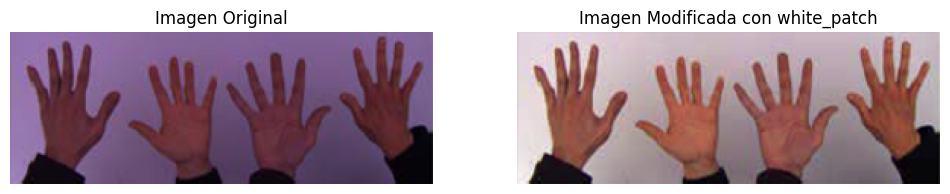

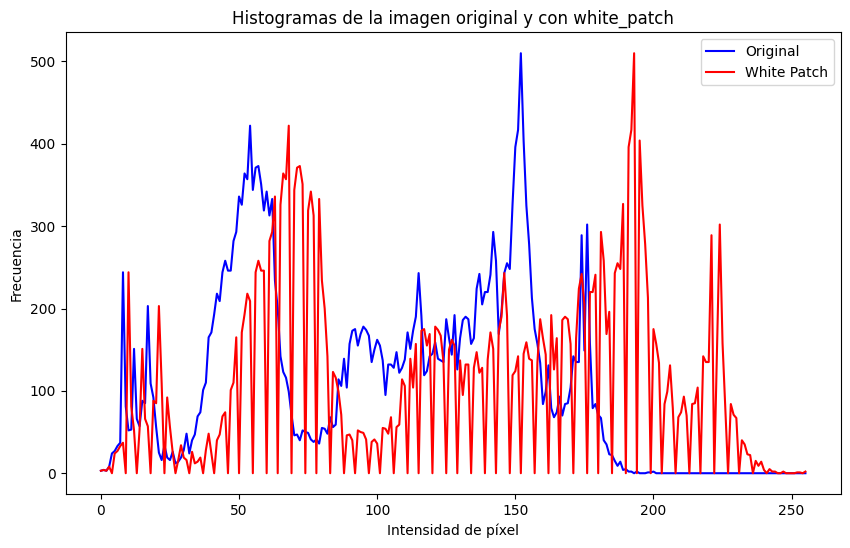

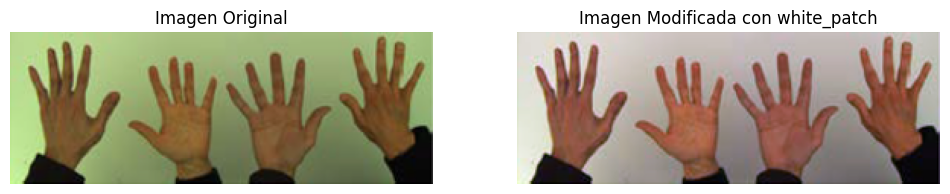

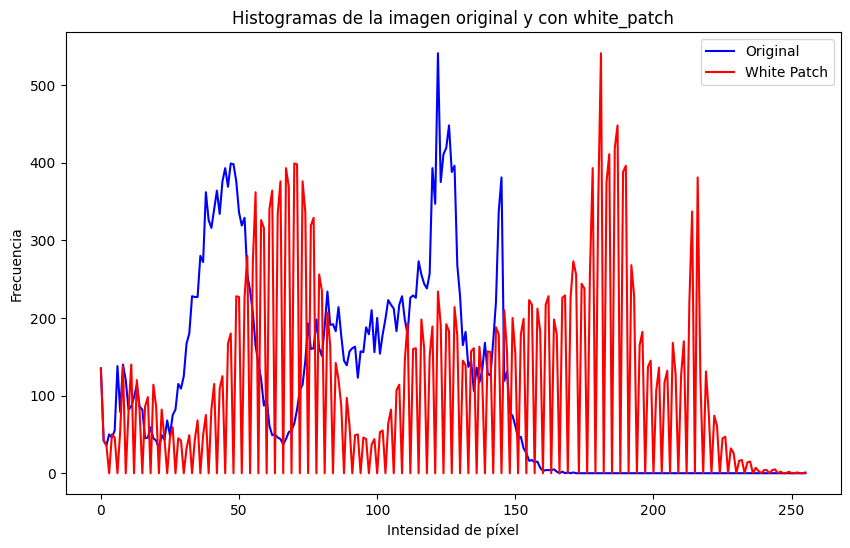

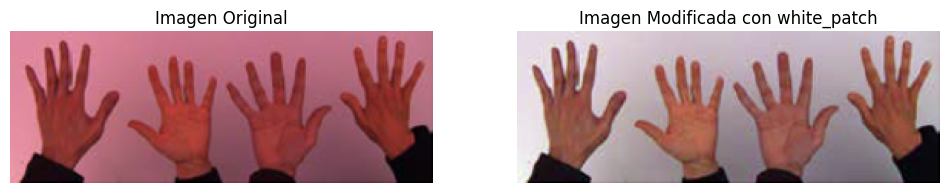

...

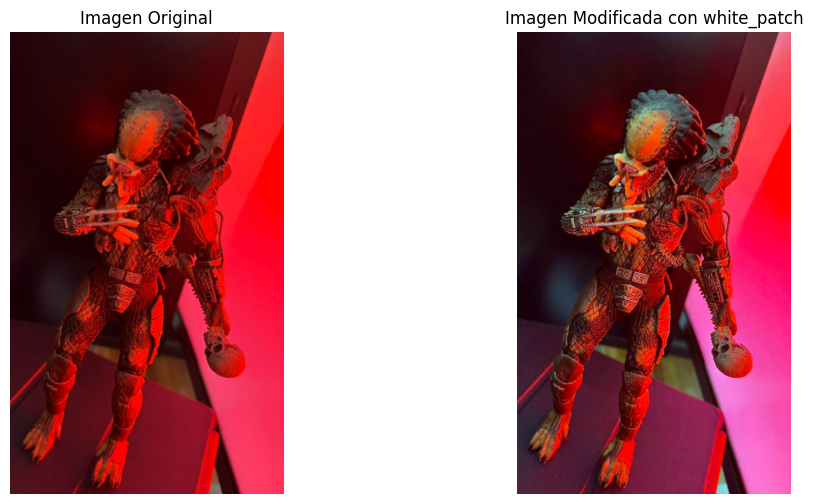

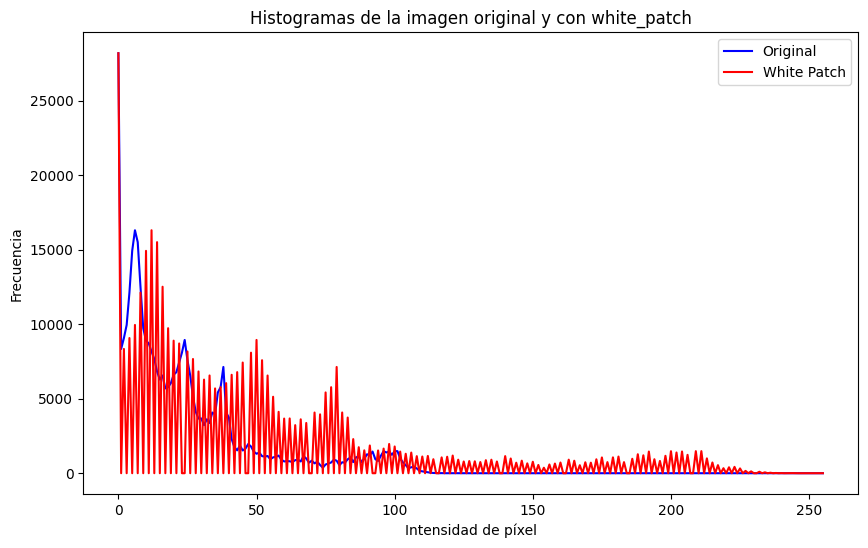

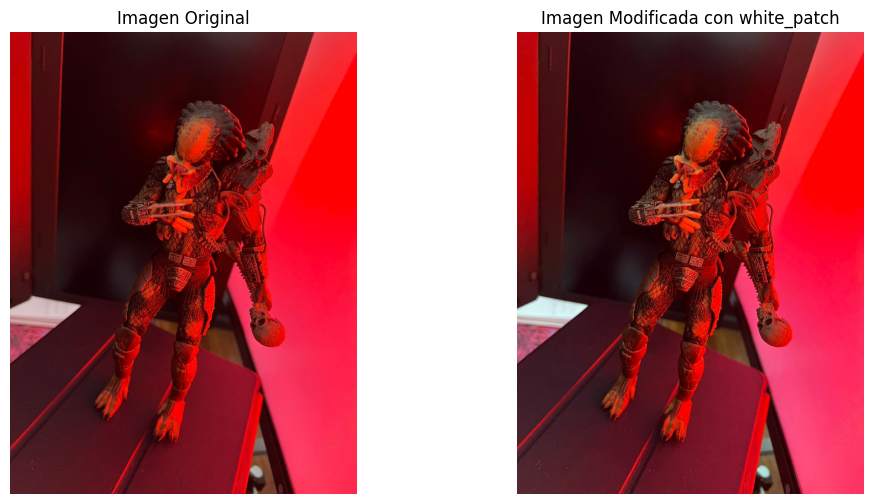

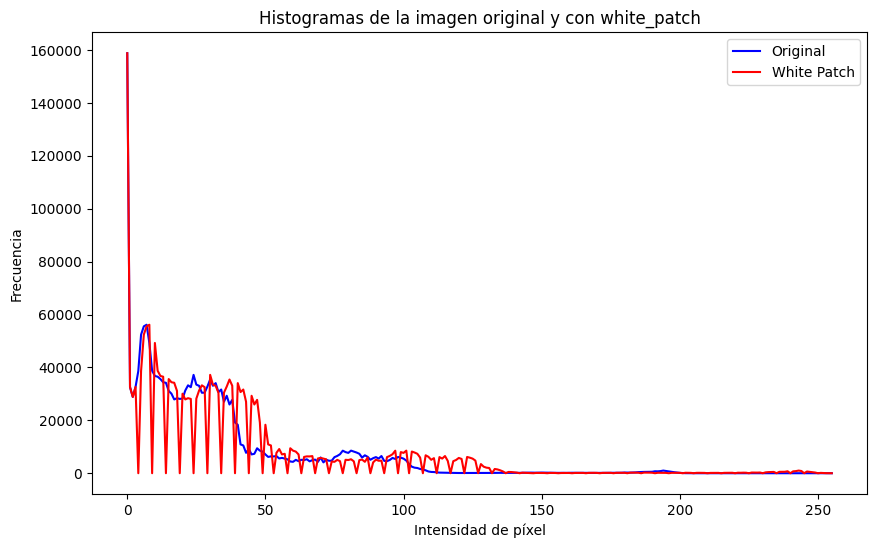

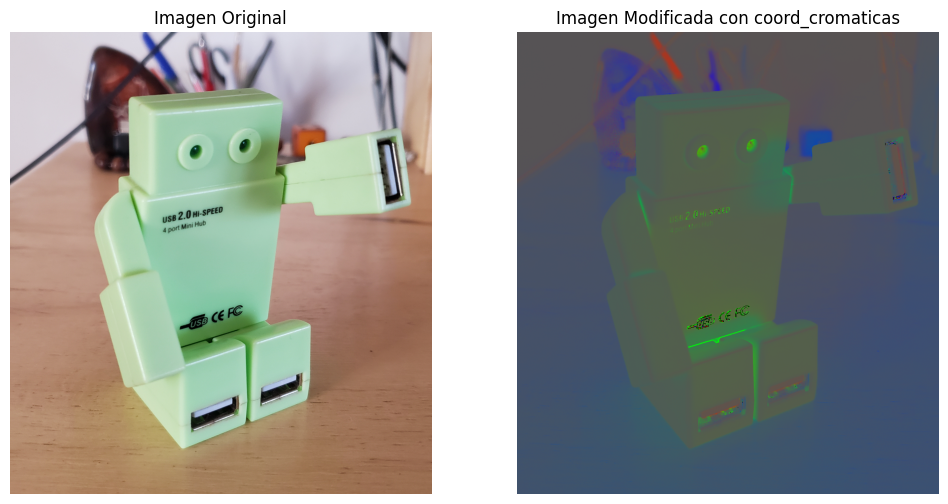

Lllego coordenadas cromáticas


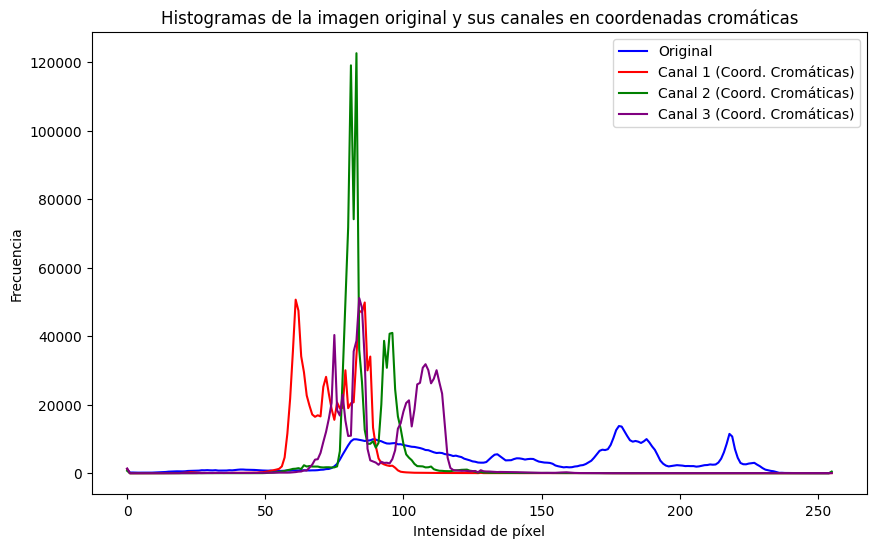

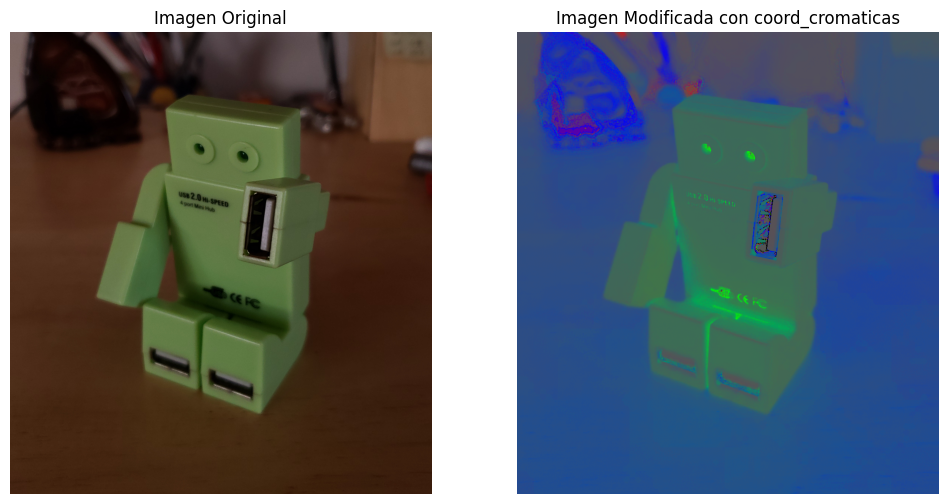

Lllego coordenadas cromáticas


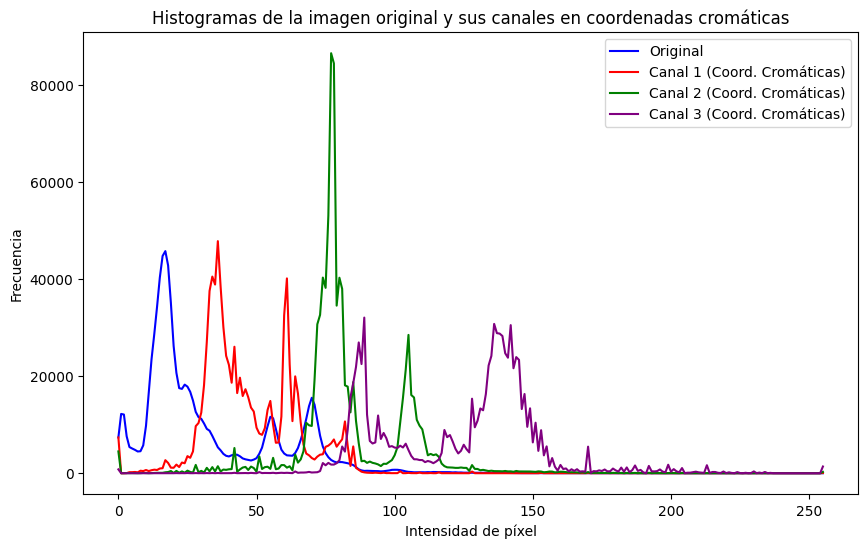

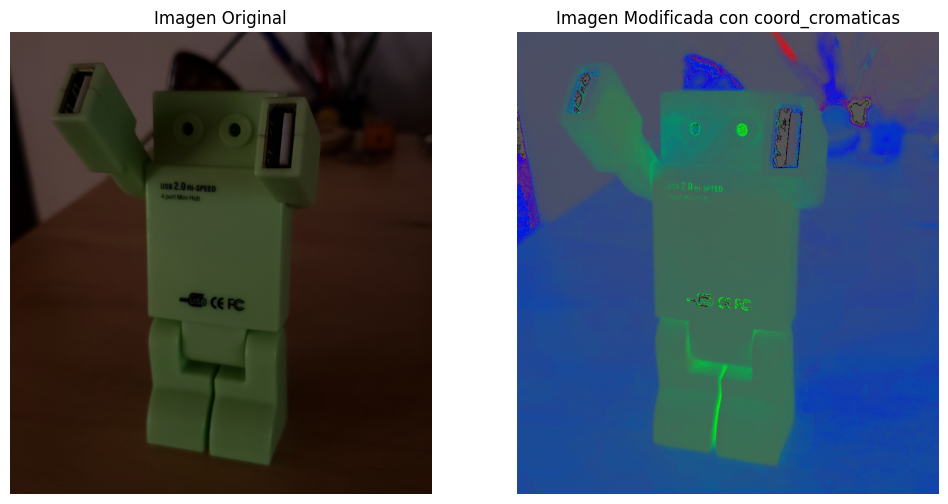

Lllego coordenadas cromáticas


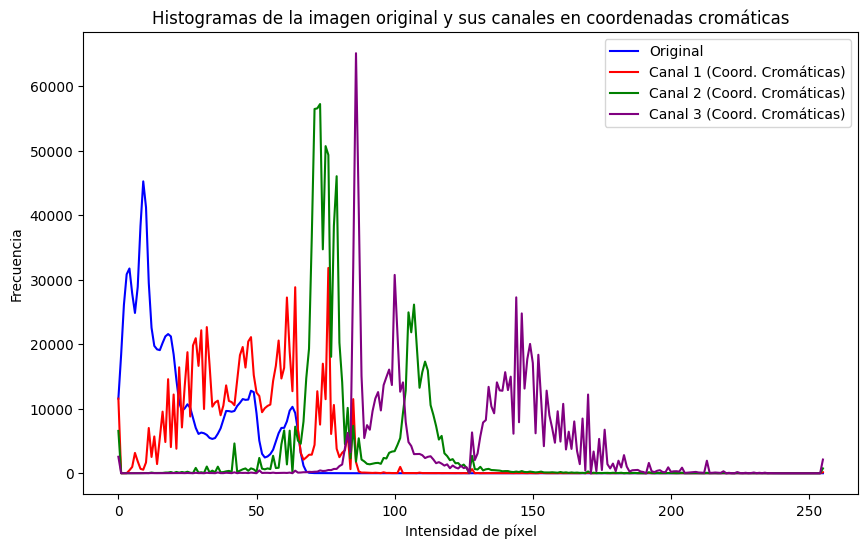

In [39]:
ejecutar_algotimo('white_patch',rutas_imagenes_white_patch)
ejecutar_algotimo('coord_cromaticas',rutas_imagenes_coord_cromaticas)

# **Parte 2: Análisis de Imágenes y Segmentación**



1. **Lectura y Visualización de Imágenes en Escala de Grises**:
   - Leer las imágenes `img1_tp.png` y `img2_tp.png` con OpenCV en escala de grises.
   - Visualizar las imágenes leídas.

2. **Análisis de Histogramas**:
   - Elija el número de bins que crea conveniente y grafique el histograma de cada imagen.
   - Compare los histogramas entre sí y explique lo que se observa.
   - Discuta si estos histogramas podrían ser útiles como 'features' para entrenar un modelo de clasificación o detección de imágenes.

3. **Segmentación de Imágenes**:
   - Para la imagen `segmentacion.png`, analice el histograma de los canales RGB.
   - Segmente algunos de los elementos presentes en la imagen (agua, cielo, tierra) y muestre, aplicando máscaras, las regiones en imágenes separadas.

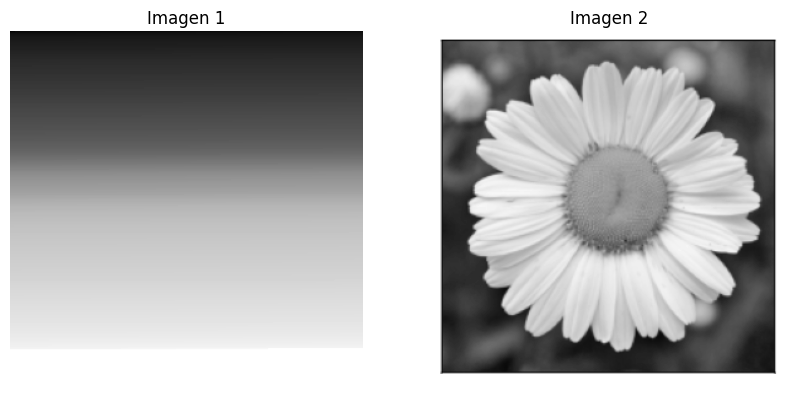

In [48]:
# Leer imágenes en escala de grises
img1_path = 'img1_tp.png'
img2_path = 'img2_tp.png'
img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

# Verificar que las imágenes se hayan leído correctamente
if img1 is None or img2 is None:
    print(f"Error al leer las imágenes. Verifique las rutas:\n{img1_path}\n{img2_path}")
else:
    # Visualizar imágenes
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img1, cmap='gray')
    plt.title('Imagen 1')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img2, cmap='gray')
    plt.title('Imagen 2')
    plt.axis('off')

    plt.show()



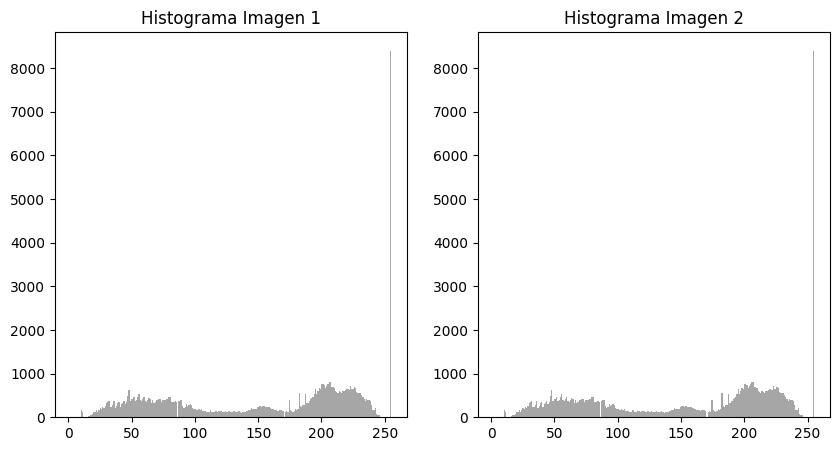

In [49]:
# Número de bins
bins = 256

# Calcular y graficar histogramas
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(img1.ravel(), bins=bins, color='gray', alpha=0.7)
plt.title('Histograma Imagen 1')

plt.subplot(1, 2, 2)
plt.hist(img2.ravel(), bins=bins, color='gray', alpha=0.7)
plt.title('Histograma Imagen 2')

plt.show()


In [50]:
import numpy as np

def calculate_histogram_distance(hist1, hist2):
    """
    Calcula la distancia euclidiana entre dos histogramas.
    """
    return np.sqrt(np.sum((hist1 - hist2) ** 2))

# Calcular los histogramas de las imágenes
hist1, _ = np.histogram(img1.ravel(), bins=bins)
hist2, _ = np.histogram(img2.ravel(), bins=bins)

# Normalizar los histogramas
hist1 = hist1 / np.sum(hist1)
hist2 = hist2 / np.sum(hist2)

# Calcular la distancia entre los histogramas
distance = calculate_histogram_distance(hist1, hist2)
print(f"Distancia entre los histogramas: {distance}")



Distancia entre los histogramas: 0.0


## Análisis de Histogramas para la Clasificación o Detección de Imágenes

El número de bins elegido afecta el nivel de detalle capturado en la distribución de intensidades. Un número mayor de bins proporciona un histograma más detallado, útil para capturar diferencias sutiles entre imágenes, lo cual puede ser relevante si características como el contraste o la iluminación son importantes para la tarea de clasificación. La distancia euclidiana entre los histogramas normalizados indica la similitud en la distribución de intensidades; una distancia de 0.0 implica que los histogramas son idénticos, aunque esto no garantiza que las imágenes sean visualmente idénticas en todos los aspectos.

La utilidad de los histogramas como características (features) para entrenar un modelo depende de si las diferencias en la distribución de intensidades son relevantes para la clasificación. Si bien una distancia de 0.0 entre histogramas sugiere una alta similitud en la distribución de intensidades, es importante considerar otros factores visuales y contextuales al desarrollar un modelo de clasificación o detección de imágenes, ya que los histogramas no capturan la información espacial de la distribución de píxeles en la imagen. Como lo que ocurre en este caso.

  
Obnservando ambos histogramas se puede apreciar que son prácticamente idénticos, esto sugiere que las distribuciones de intensidades de píxeles en ambas imágenes son muy similares. En este caso, los histogramas pueden no ser características útiles para distinguir entre estas dos imágenes específicas.


# **Paso 3: Segmentación de Imagen y Análisis de Histograma RGB**


In [57]:
#Si queremos que las imágenes sean mostradas en una ventana emergente quitar el inline
#%matplotlib

import numpy as np
import cv2 as cv2
import matplotlib.pyplot as plt

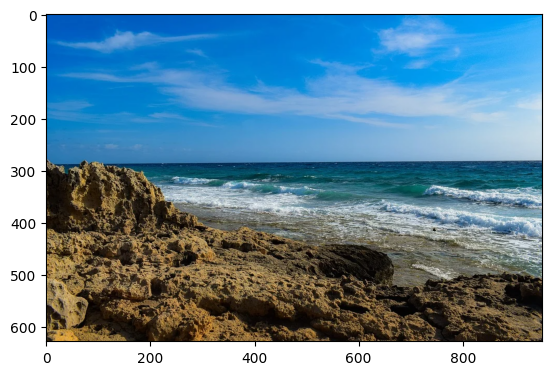

In [58]:
# Cargar la imagen color
img_color = cv2.imread('segmentacion.png')
imgRGB = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)

plt.figure(1)
plt.imshow(imgRGB)
plt.show()

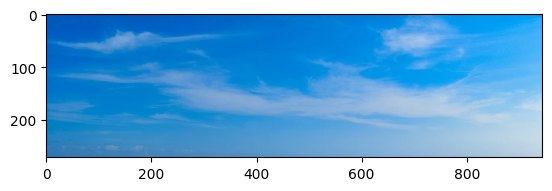

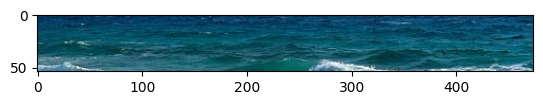

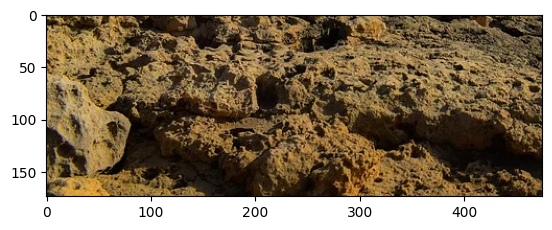

In [59]:
# Tomamos una muestra del cielo
img_muestra_cielo = imgRGB[0:272, 0:944,:]
plt.figure(2)
plt.imshow(img_muestra_cielo)
plt.show()

# Tomamos una muestra del cielo
img_muestra_agua = imgRGB[285:339, 470:944,:]
plt.figure(2)
plt.imshow(img_muestra_agua)
plt.show()

# Tomamos una muestra del cielo
img_muestra_tierra = imgRGB[450:624, 0:475 ,:]
plt.figure(2)
plt.imshow(img_muestra_tierra)
plt.show()

In [60]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 3 sigmas
# para ¨capturar¨ el 99.7 % de pixeles.
def segmentar(color_mean,color_std,segmento):
    n_sigma = 3
    mask = cv2.inRange(imgRGB, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
    img_segmentada = cv2.bitwise_and(imgRGB, imgRGB, mask=mask)

    plt.figure(3)
    plt.imshow(img_segmentada)
    plt.title('Segmentacion de '+segmento)
    plt.show()

[60.80524831754735, 150.52145516575274, 216.04247414007975]
[57.77849745962121, 29.189458512750512, 16.16267070905737]


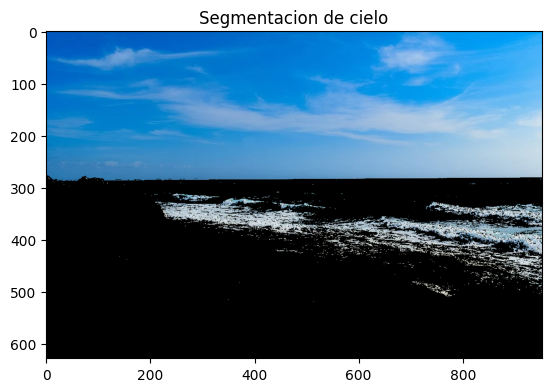

[21.811142365994687, 86.50007813720894, 108.03008282544147]
[32.67334495861097, 28.145721343324507, 25.911693863892722]


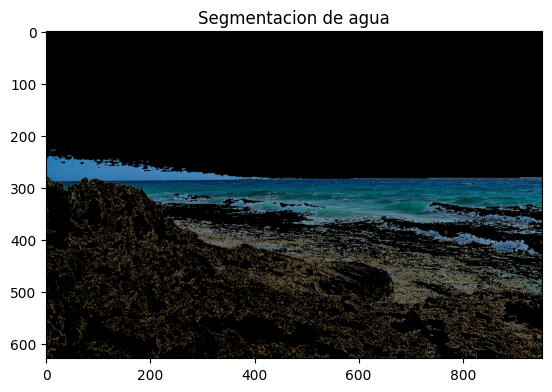

[98.23891107078039, 76.41150635208712, 45.079455535390196]
[58.90716192533775, 51.74653701117818, 37.25654316569072]


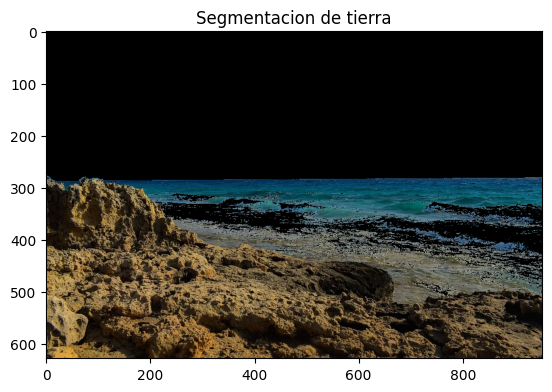

In [61]:
# Calculamos un modelo estadístico sencillo para caracterizar 
#el color del cielo en el espacio RGB
color_mean_cielo, color_std_cielo = cv.meanStdDev(img_muestra_cielo)
print(color_mean_cielo.flatten().tolist())
print(color_std_cielo.flatten().tolist())
segmentar(color_mean_cielo,color_std_cielo,'cielo')

# Calculamos un modelo estadístico sencillo para caracterizar 
#el color del agua en el espacio RGB
color_mean_agua, color_std_agua = cv.meanStdDev(img_muestra_agua)
print(color_mean_agua.flatten().tolist())
print(color_std_agua.flatten().tolist())
segmentar(color_mean_agua,color_std_agua,'agua')

# Calculamos un modelo estadístico sencillo para caracterizar
# el color de la tierra en el espacio RGB
color_mean_tierra, color_std_tierra = cv.meanStdDev(img_muestra_tierra)
print(color_mean_tierra.flatten().tolist())
print(color_std_tierra.flatten().tolist())
segmentar(color_mean_tierra,color_std_tierra,'tierra')

## Realizamos otras pruebas de segmentacion

In [64]:
#Ruta d ela imagen a segmentar
rutaImagen ='segmentacion.png'

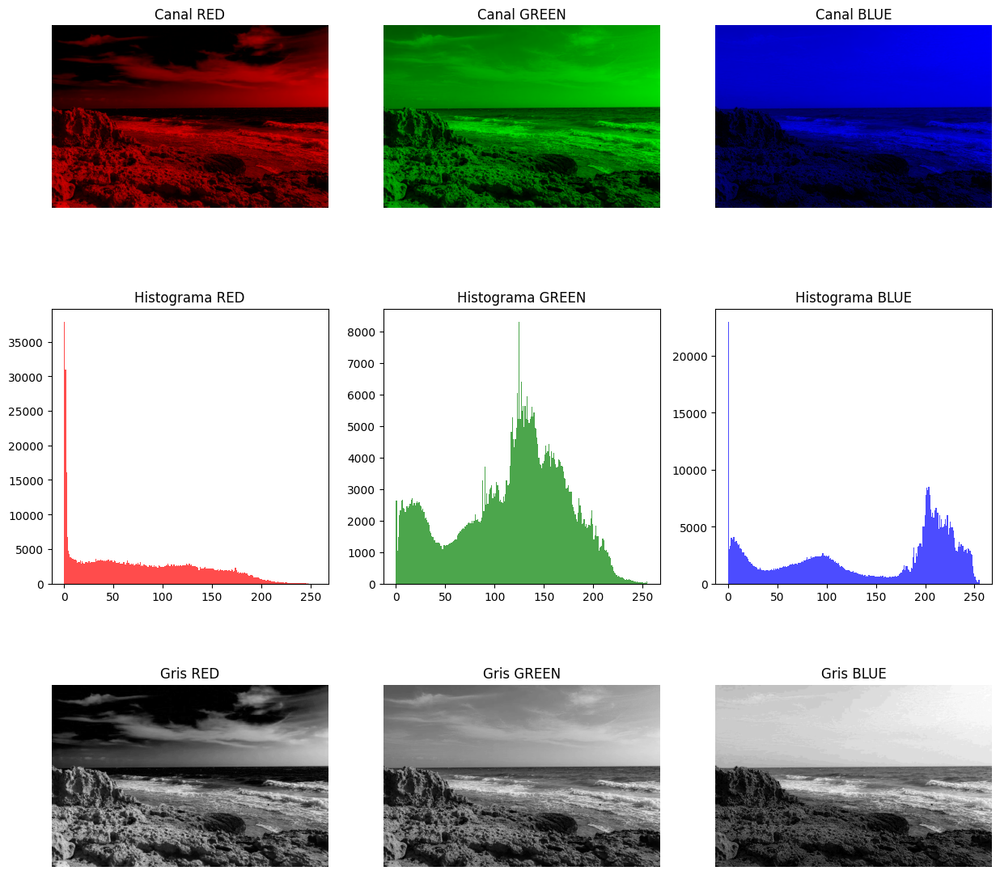

In [65]:

# Leer imagen en color

segmentacion = cv2.imread(rutaImagen)

# Convertir a RGB (OpenCV lee imágenes en BGR)
segmentacion_rgb = cv2.cvtColor(segmentacion, cv2.COLOR_BGR2RGB)

# Número de bins para el histograma
bins = 256

# Visualizar imágenes de un solo canal y sus histogramas
plt.figure(figsize=(15, 15))
for i, color in enumerate(['red', 'green', 'blue']):
    # Crear una imagen en negro
    single_channel_image = np.zeros_like(segmentacion_rgb)

    # Asignar el canal correspondiente a la imagen en negro
    single_channel_image[:, :, i] = segmentacion_rgb[:, :, i]

    # Mostrar la imagen de un solo canal
    plt.subplot(3, 3, i + 1)
    plt.imshow(single_channel_image)
    plt.title(f'Canal {color.upper()}')
    plt.axis('off')

    # Mostrar el histograma del canal correspondiente
    plt.subplot(3, 3, i + 4)
    plt.hist(segmentacion_rgb[:, :, i].ravel(), bins=bins, color=color, alpha=0.7)
    plt.title(f'Histograma {color.upper()}')

    # Convertir la imagen de un solo canal a escala de grises
    gray_image = cv2.cvtColor(single_channel_image, cv2.COLOR_RGB2GRAY)

    # Mostrar la imagen en escala de grises
    plt.subplot(3, 3, i + 7)
    plt.imshow(gray_image, cmap='gray')
    plt.title(f'Gris {color.upper()}')
    plt.axis('off')

plt.show()



In [66]:
def segment_image(image, red_range, green_range, blue_range):
    """
    Segmenta una imagen basándose en rangos de valores para los canales de color.

    Parámetros:
    - image: Imagen en formato RGB.
    - red_range: Tupla con el rango de valores para el canal rojo (min, max).
    - green_range: Tupla con el rango de valores para el canal verde (min, max).
    - blue_range: Tupla con el rango de valores para el canal azul (min, max).

    Retorna:
    - mask: Máscara binaria que indica la segmentación.
    - segmented_image: Imagen con la segmentación aplicada.
    """
    # Descomponer la imagen en canales R, G, B
    red_channel, green_channel, blue_channel = image[:, :, 0], image[:, :, 1], image[:, :, 2]

    # Aplicar rangos para segmentar la imagen
    mask = (red_channel >= red_range[0]) & (red_channel <= red_range[1]) & \
           (green_channel >= green_range[0]) & (green_channel <= green_range[1]) & \
           (blue_channel >= blue_range[0]) & (blue_channel <= blue_range[1])

    # Crear una imagen segmentada
    segmented_image = np.zeros_like(image)
    segmented_image[mask] = image[mask]

    return mask, segmented_image

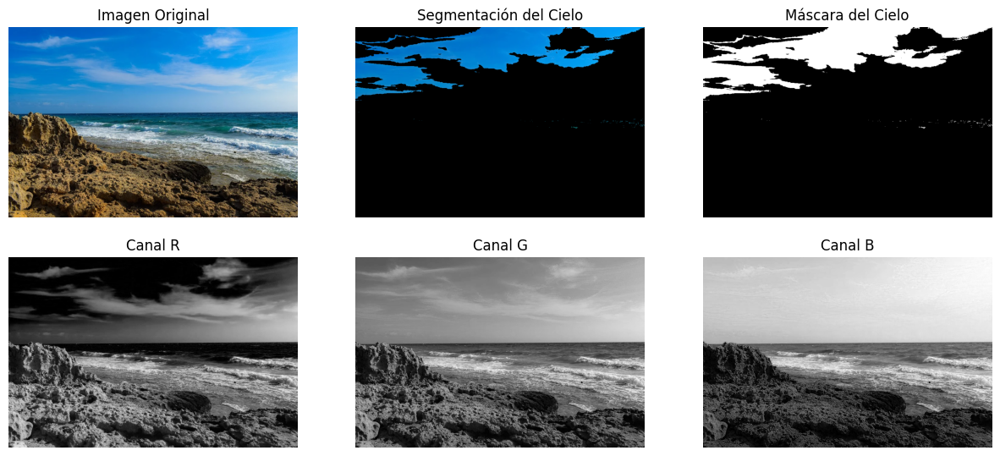

In [67]:
# Leer imagen en color
segmentacion = cv2.imread(rutaImagen)

# Convertir a RGB (OpenCV lee imágenes en BGR)
segmentacion_rgb = cv2.cvtColor(segmentacion, cv2.COLOR_BGR2RGB)

# Definir rangos de valores para los canales de color
red_range = (0, 30)  # Valores bajísimos en rojo
green_range = (110, 200)  # Valores medio-altos en verde
blue_range = (90, 255)  # Valores altísimos en azul

# Aplicar la función de segmentación del cielo
mask, segmented_sky = segment_image(segmentacion_rgb, red_range , green_range, blue_range)

# Visualizar la segmentación, la imagen original y la descomposición por canales
plt.figure(figsize=(15, 10))

# Imagen original
plt.subplot(3, 3, 1)
plt.imshow(segmentacion_rgb)
plt.title('Imagen Original')
plt.axis('off')

# Segmentación del cielo
plt.subplot(3, 3, 2)
plt.imshow(segmented_sky)
plt.title('Segmentación del Cielo')
plt.axis('off')

# Máscara del cielo
plt.subplot(3, 3, 3)
plt.imshow(mask, cmap='gray')
plt.title('Máscara del Cielo')
plt.axis('off')

# Descomposición por canales en escala de grises
for i, color in enumerate(['R', 'G', 'B']):
    plt.subplot(3, 3, i + 4)
    plt.imshow(segmentacion_rgb[:, :, i], cmap='gray')
    plt.title(f'Canal {color}')
    plt.axis('off')


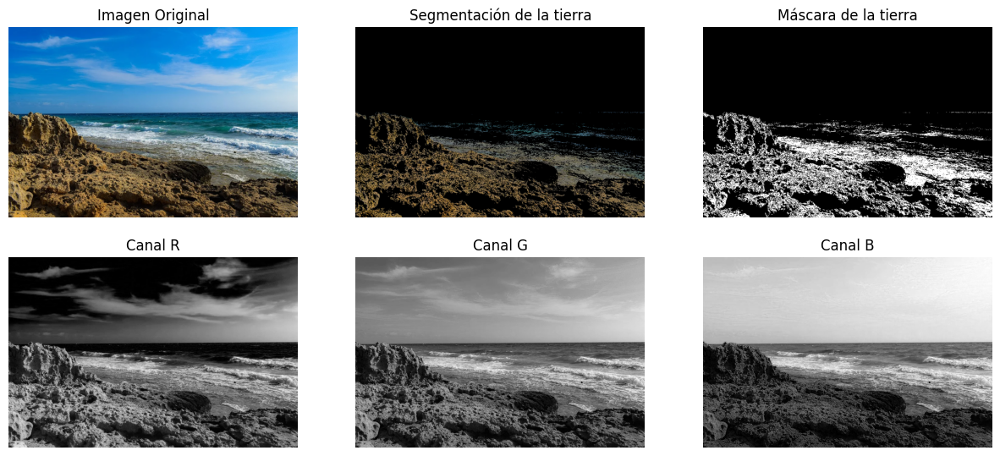

In [68]:
# Definir rangos de valores para los canales de color
red_range = (50, 255)  # Evitar colores rojos bajos
green_range = (70, 150)  # Valores medios en verde
blue_range = (40, 130)  # Azules bajos pero no tan bajos


# Aplicar la función de segmentación del cielo
mask, segmented_sky = segment_image(segmentacion_rgb, red_range , green_range, blue_range)

# Visualizar la segmentación, la imagen original y la descomposición por canales
plt.figure(figsize=(15, 10))

# Imagen original
plt.subplot(3, 3, 1)
plt.imshow(segmentacion_rgb)
plt.title('Imagen Original')
plt.axis('off')

# Segmentación del cielo
plt.subplot(3, 3, 2)
plt.imshow(segmented_sky)
plt.title('Segmentación de la tierra')
plt.axis('off')

# Máscara del cielo
plt.subplot(3, 3, 3)
plt.imshow(mask, cmap='gray')
plt.title('Máscara de la tierra')
plt.axis('off')

# Descomposición por canales en escala de grises
for i, color in enumerate(['R', 'G', 'B']):
    plt.subplot(3, 3, i + 4)
    plt.imshow(segmentacion_rgb[:, :, i], cmap='gray')
    plt.title(f'Canal {color}')
    plt.axis('off')


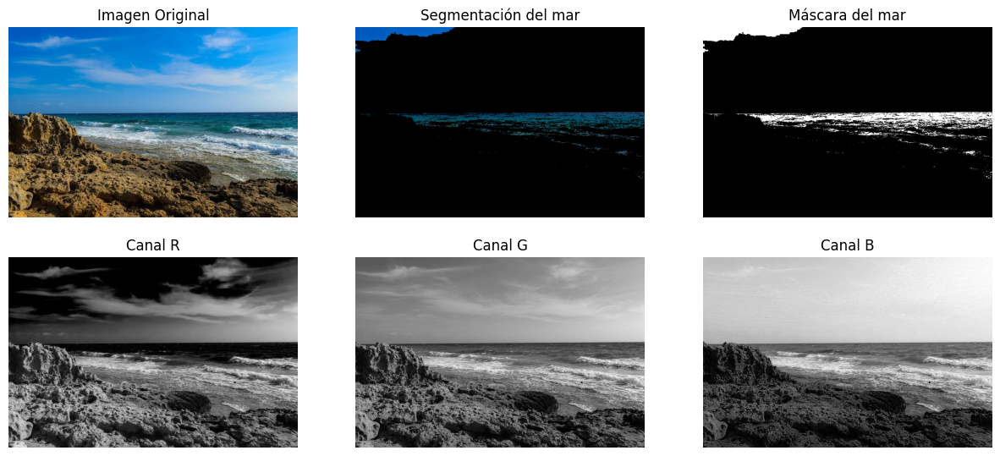

In [69]:
# Definir rangos de valores para los canales de color
red_range = (0, 80)  # Rojos muy bajos o bajos
green_range = (0, 100)  # Verdes bajos
blue_range = (90, 255)  # Azules oscuros


# Aplicar la función de segmentación del cielo
mask, segmented_sky = segment_image(segmentacion_rgb, red_range , green_range, blue_range)

# Visualizar la segmentación, la imagen original y la descomposición por canales
plt.figure(figsize=(15, 10))

# Imagen original
plt.subplot(3, 3, 1)
plt.imshow(segmentacion_rgb)
plt.title('Imagen Original')
plt.axis('off')

# Segmentación del cielo
plt.subplot(3, 3, 2)
plt.imshow(segmented_sky)
plt.title('Segmentación del mar')
plt.axis('off')

# Máscara del cielo
plt.subplot(3, 3, 3)
plt.imshow(mask, cmap='gray')
plt.title('Máscara del mar')
plt.axis('off')

# Descomposición por canales en escala de grises
for i, color in enumerate(['R', 'G', 'B']):
    plt.subplot(3, 3, i + 4)
    plt.imshow(segmentacion_rgb[:, :, i], cmap='gray')
    plt.title(f'Canal {color}')
    plt.axis('off')


Fin